# Lab Assignments
Filip Moreau  
Advanced Machine Learning - DA633E, VT22

## General

In [2]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision import datasets, models, transforms

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random
from collections import Counter
import re
import pandas as pd

import seaborn as sns                           # pip install seaborn
import cv2                                      # pip install opencv-python
from datasets import load_dataset               # pip install datasets
from sklearn.metrics import confusion_matrix    # pip install sklearn

C:\Users\filip\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [623]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print('running on:', device)

running on: cuda:0


In [624]:
data_images_path = 'data/images/'
data_datasets_path = 'data/datasets/'

- - -
## Computer Vision

### Compare CNN with MLP

In [ ]:
input_size  = 224*224   # images are 224x224 pixels
output_size = 1      # there is 1 class (hot dog/not hot dog)

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

image_datasets = {x: datasets.ImageFolder(f'{data_datasets_path}/hotdog/{x}', data_transforms[x]) for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16, shuffle=True, num_workers=4) for x in ['train', 'test']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

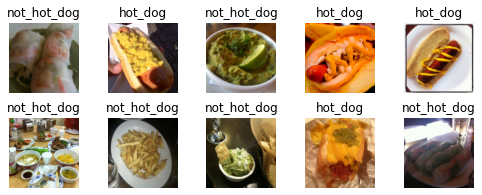

In [ ]:
def imshow():
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])

    plt.figure(figsize=(7, 2.8))
    for i in range(10):
        plt.subplot(2, 5, i+1)
        
        image, label = dataloaders['train'].dataset[random.randint(0, len(dataloaders['train'].dataset))]
        image = image.permute(1,2,0)
        image = std * image + mean
        image = np.clip(image, 0, 1)

        plt.imshow(image.squeeze()); plt.axis('off')
        plt.title(f'{class_names[label]}')

    plt.tight_layout()


def imshow2(images, labels):
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])

    plt.figure(figsize=(7, 2.8))
    for i in range(10):
        plt.subplot(2, 5, i+1)
        
        images[i] = images[i].permute(1,2,0)
        images[i] = std * images[i] + mean
        images[i] = np.clip(images[i], 0, 1)
        plt.imshow(images[i].squeeze()); plt.axis('off')
        plt.title(f'{class_names[labels[i]]}')
        
    plt.tight_layout()


imshow()

In [ ]:
loss_train_cnn = []
loss_train_mlp = []
accuracy_train_cnn = []
accuracy_train_mlp = []
precision_train_cnn = []
precision_train_mlp = []
recall_train_cnn = []
recall_train_mlp = []
f1_train_cnn = []
f1_train_mlp = []

loss_test_cnn = []
loss_test_mlp = []
accuracy_test_cnn = []
accuracy_test_mlp = []
precision_test_cnn = []
precision_test_mlp = []
recall_test_cnn = []
recall_test_mlp = []
f1_test_cnn = []
f1_test_mlp = []

In [ ]:
def train_model(model, criterion, optimizer):
    model.train()
    loss = 0.0
    corrects = 0
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for X, y in dataloaders['train']:
        X, y = X.to(device), y.to(device)

        optimizer.zero_grad()

        pred = model(X)
        loss = criterion(pred, y)
        
        loss.backward()
        optimizer.step()
        
        loss += loss.item() * X.size(0)
        corrects += (pred.argmax(1) == y).type(torch.float).sum().item()
        true_positives += ((pred.argmax(1) == y) & (pred.argmax(1) == 0)).type(torch.float).sum()  # 0 = hot dog => Positive
        false_positives += ((pred.argmax(1) != y) & (pred.argmax(1) == 0)).type(torch.float).sum() # 0 = hot dog => Positive
        false_negatives += ((pred.argmax(1) != y) & (pred.argmax(1) == 1)).type(torch.float).sum() # 1 = not hot dog => Negative


    epoch_loss = loss / dataset_sizes['train']
    epoch_accuracy = corrects / dataset_sizes['train']
    epoch_precision = true_positives / (true_positives + false_positives)
    epoch_recall = true_positives / (true_positives + false_negatives)
    epoch_f1 = (2 * epoch_recall * epoch_precision) / (epoch_recall + epoch_precision)

    if model == model_cnn:
        loss_train_cnn.append(epoch_loss)
        accuracy_train_cnn.append(epoch_accuracy)
        precision_train_cnn.append(epoch_precision)
        recall_train_cnn.append(epoch_recall)
        f1_train_cnn.append(epoch_f1)
    else:
        loss_train_mlp.append(epoch_loss)
        accuracy_train_mlp.append(epoch_accuracy)
        precision_train_mlp.append(epoch_precision)
        recall_train_mlp.append(epoch_recall)
        f1_train_mlp.append(epoch_f1)

    print(f'  TRAIN\t loss: {epoch_loss:.4f}  |  accuracy: {epoch_accuracy:.4f}  |  precision: {epoch_precision:.4f}  |  recall: {epoch_recall:.4f}  |  F1-score: {epoch_f1:.4f}')

#####

def test_model(model, criterion):
    model.eval()
    loss = 0.0
    corrects = 0
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    
    for X, y in dataloaders['test']:
        X, y = X.to(device), y.to(device)

        with torch.no_grad():
            pred = model(X)
        loss = criterion(pred, y)
        
        loss += loss.item() * X.size(0)
        corrects += (pred.argmax(1) == y).type(torch.float).sum().item()
        true_positives += ((pred.argmax(1) == y) & (pred.argmax(1) == 0)).type(torch.float).sum()  # 0 = hot dog => Positive
        false_positives += ((pred.argmax(1) != y) & (pred.argmax(1) == 0)).type(torch.float).sum() # 0 = hot dog => Positive
        false_negatives += ((pred.argmax(1) != y) & (pred.argmax(1) == 1)).type(torch.float).sum() # 1 = not hot dog => Negative
        

    epoch_loss = loss / dataset_sizes['test']
    epoch_accuracy = corrects / dataset_sizes['test']
    epoch_precision = true_positives / (true_positives + false_positives)
    epoch_recall = true_positives / (true_positives + false_negatives)
    epoch_f1 = (2 * epoch_recall * epoch_precision) / (epoch_recall + epoch_precision)

    if model == model_cnn:
        loss_test_cnn.append(epoch_loss)
        accuracy_test_cnn.append(epoch_accuracy)
        precision_test_cnn.append(epoch_precision)
        recall_test_cnn.append(epoch_recall)
        f1_test_cnn.append(epoch_f1)
    else:
        loss_test_mlp.append(epoch_loss)
        accuracy_test_mlp.append(epoch_accuracy)
        precision_test_mlp.append(epoch_precision)
        recall_test_mlp.append(epoch_recall)
        f1_test_mlp.append(epoch_f1)

    print(f'  TEST\t loss: {epoch_loss:.4f}  |  accuracy: {epoch_accuracy:.4f}  |  precision: {epoch_precision:.4f}  |  recall: {epoch_recall:.4f}  |  F1-score: {epoch_f1:.4f}')

#####

def visualize_model(model):
    model.eval()

    images = [None]*10
    labels = [None]*10
    counter = 0

    for X, y in dataloaders['test']:
        X, y = X.to(device), y.to(device)

        with torch.no_grad():
            pred = model(X)
            
        print()

        for j in range(X.size()[0]):
            images[counter] = X[j].cpu()
            labels[counter] = pred.argmax(1)[j].cpu()

            counter += 1
            if (counter >= 10):
                imshow2(images, labels)
                return

In [ ]:
n_features = 10
learning_rate = 0.01
momentum = 0.5
epochs = 25

#### CNN

In [ ]:
class CNN(nn.Module):
    def __init__(self, n_features):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=n_features, kernel_size=5)
        self.conv2 = nn.Conv2d(n_features, n_features, kernel_size=5)

        self.conv2_drop = nn.Dropout2d()
        self.flatten = nn.Flatten()
        
        self.fc1 = nn.Linear(n_features*53*53, 1024)
        self.fc2 = nn.Linear(1024, 2)   
        
    def forward(self, x):
        x = self.conv1(x)
        x = F.max_pool2d(x, 2)
        x = F.relu(x)

        x = self.conv2(x)
        x = self.conv2_drop(x)
        x = F.max_pool2d(x, 2)
        x = F.relu(x)

        x = self.flatten(x)
        x = self.fc1(x)
        x = F.relu(x)
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return x

In [ ]:
model_cnn = CNN(n_features)
model_cnn.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model_cnn.parameters(), lr=learning_rate, momentum=momentum)
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

print(model_cnn)
print('Number of parameters: {}'.format(sum(p.numel() for p in model_cnn.parameters() if p.requires_grad)))

CNN(
  (conv1): Conv2d(3, 10, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(10, 10, kernel_size=(5, 5), stride=(1, 1))
  (conv2_drop): Dropout2d(p=0.5, inplace=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=28090, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=2, bias=True)
)
Number of parameters: 28770504


In [ ]:
for epoch in range(epochs):
    print('Epoch {}/{}'.format(epoch+1, epochs))
    train_model(model_cnn, criterion, optimizer)
    test_model(model_cnn, criterion)
    scheduler.step()

Epoch 1/25


C:\Users\filip\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


  TRAIN	 loss: 0.0044  |  accuracy: 0.5020  |  precision: 0.5016  |  recall: 0.6426  |  F1-score: 0.5634
  TEST	 loss: 0.0071  |  accuracy: 0.6180  |  precision: 0.5913  |  recall: 0.7640  |  F1-score: 0.6667
Epoch 2/25
  TRAIN	 loss: 0.0034  |  accuracy: 0.5502  |  precision: 0.5648  |  recall: 0.4378  |  F1-score: 0.4932
  TEST	 loss: 0.0054  |  accuracy: 0.5300  |  precision: 0.5157  |  recall: 0.9840  |  F1-score: 0.6768
Epoch 3/25
  TRAIN	 loss: 0.0045  |  accuracy: 0.5622  |  precision: 0.5756  |  recall: 0.4739  |  F1-score: 0.5198
  TEST	 loss: 0.0073  |  accuracy: 0.6120  |  precision: 0.7154  |  recall: 0.3720  |  F1-score: 0.4895
Epoch 4/25
  TRAIN	 loss: 0.0032  |  accuracy: 0.5863  |  precision: 0.5817  |  recall: 0.6145  |  F1-score: 0.5977
  TEST	 loss: 0.0045  |  accuracy: 0.5680  |  precision: 0.6932  |  recall: 0.2440  |  F1-score: 0.3609
Epoch 5/25
  TRAIN	 loss: 0.0036  |  accuracy: 0.5683  |  precision: 0.5548  |  recall: 0.6908  |  F1-score: 0.6154
  TEST	 loss: 0

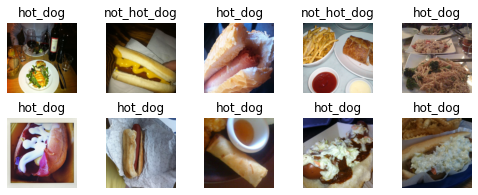

In [ ]:
visualize_model(model_cnn)

#### MLP

In [ ]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_size*3, 1024), #224*224*3
            nn.ReLU(),
            nn.Linear(1024, 1024),
            nn.ReLU(),
            nn.Linear(1024, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )
     
    def forward(self, x):
        x = self.layers(x)
        return F.log_softmax(x, dim=1)

In [ ]:
model_mlp = MLP()
model_mlp.to(device)

optimizer = optim.SGD(model_mlp.parameters(), lr=learning_rate, momentum=momentum)
criterion = nn.CrossEntropyLoss()
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

print(model_mlp)
print('Number of parameters: {}'.format(sum(p.numel() for p in model_mlp.parameters() if p.requires_grad)))

MLP(
  (layers): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=150528, out_features=1024, bias=True)
    (2): ReLU()
    (3): Linear(in_features=1024, out_features=1024, bias=True)
    (4): ReLU()
    (5): Linear(in_features=1024, out_features=100, bias=True)
    (6): ReLU()
    (7): Linear(in_features=100, out_features=2, bias=True)
  )
)
Number of parameters: 155293998


In [ ]:
for epoch in range(epochs):
    print('Epoch {}/{}'.format(epoch+1, epochs))
    train_model(model_mlp, criterion, optimizer)
    test_model(model_mlp, criterion)
    scheduler.step()

Epoch 1/25
  TRAIN	 loss: 0.0022  |  accuracy: 0.6004  |  precision: 0.6179  |  recall: 0.5261  |  F1-score: 0.5683
  TEST	 loss: 0.0043  |  accuracy: 0.6340  |  precision: 0.6463  |  recall: 0.5920  |  F1-score: 0.6180
Epoch 2/25
  TRAIN	 loss: 0.0019  |  accuracy: 0.6526  |  precision: 0.6545  |  recall: 0.6466  |  F1-score: 0.6505
  TEST	 loss: 0.0056  |  accuracy: 0.5320  |  precision: 0.5571  |  recall: 0.3120  |  F1-score: 0.4000
Epoch 3/25
  TRAIN	 loss: 0.0025  |  accuracy: 0.7149  |  precision: 0.7296  |  recall: 0.6827  |  F1-score: 0.7054
  TEST	 loss: 0.0079  |  accuracy: 0.6120  |  precision: 0.6077  |  recall: 0.6320  |  F1-score: 0.6196
Epoch 4/25
  TRAIN	 loss: 0.0042  |  accuracy: 0.7731  |  precision: 0.7677  |  recall: 0.7831  |  F1-score: 0.7753
  TEST	 loss: 0.0097  |  accuracy: 0.6020  |  precision: 0.6000  |  recall: 0.6120  |  F1-score: 0.6059
Epoch 5/25
  TRAIN	 loss: 0.0010  |  accuracy: 0.7811  |  precision: 0.7991  |  recall: 0.7510  |  F1-score: 0.7743
  TE

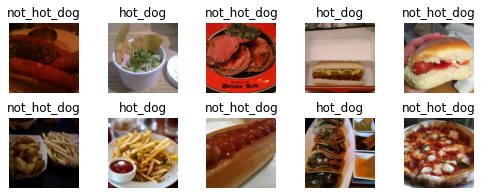

In [ ]:
visualize_model(model_mlp)

### Calculate, plot, analyze, and compare different metrics

#### Loss, Accuracy, Precision, Recall, F1-score

In [ ]:
def plot_comparison(train_cnn, test_cnn, train_mlp, test_mlp, title):
    plt.figure(figsize = (14, 5))

    train_cnn = torch.tensor(train_cnn, device = 'cpu')
    test_cnn = torch.tensor(test_cnn, device = 'cpu')
    train_mlp = torch.tensor(train_mlp, device = 'cpu')
    test_mlp = torch.tensor(test_mlp, device = 'cpu')

    plt.subplot(1, 2, 1)
    with torch.no_grad():
        plt.plot(range(len(train_cnn)), train_cnn, label = "train")
    plt.plot(range(len(test_cnn)), test_cnn, label = "test")
    plt.title(f'CNN - {title}')
    plt.xlabel('epoch')
    plt.ylabel(title)
    plt.legend()

    plt.subplot(1, 2, 2)
    with torch.no_grad():
        plt.plot(range(len(train_mlp)), train_mlp, label = "train")
    plt.plot(range(len(test_mlp)), test_mlp, label = "test")
    plt.title(f'MLP - {title}')
    plt.xlabel('epoch')
    plt.ylabel(title)
    plt.legend()
    
    plt.savefig(f'comparison_CNN_MLP_{title}.png')
    plt.show()

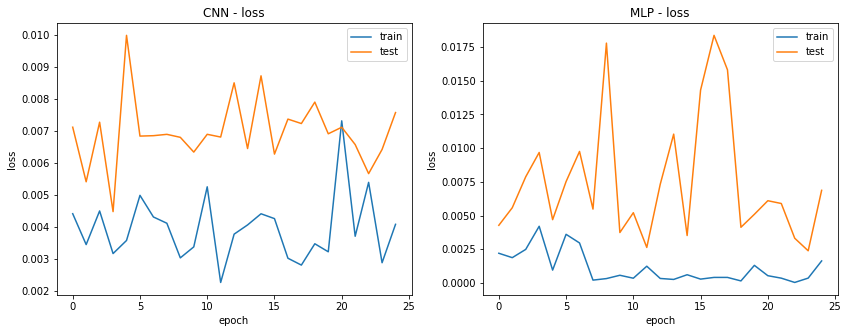

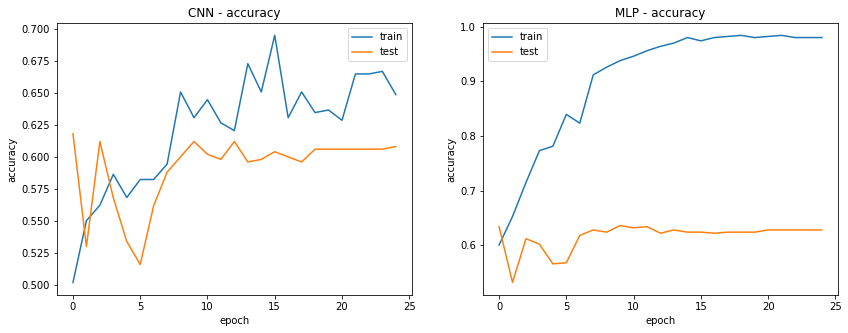

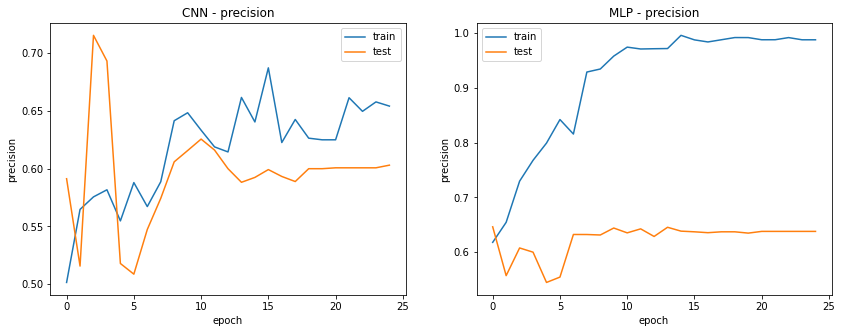

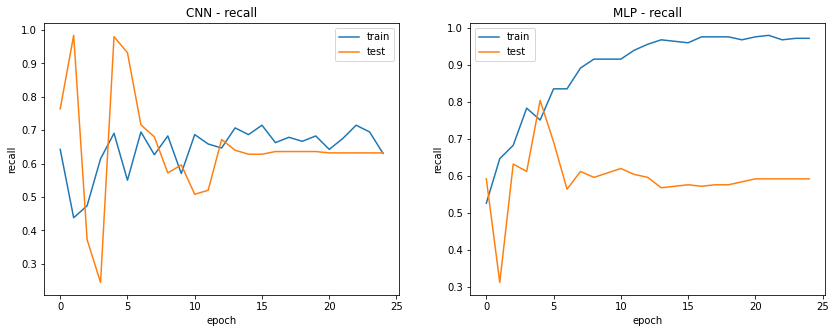

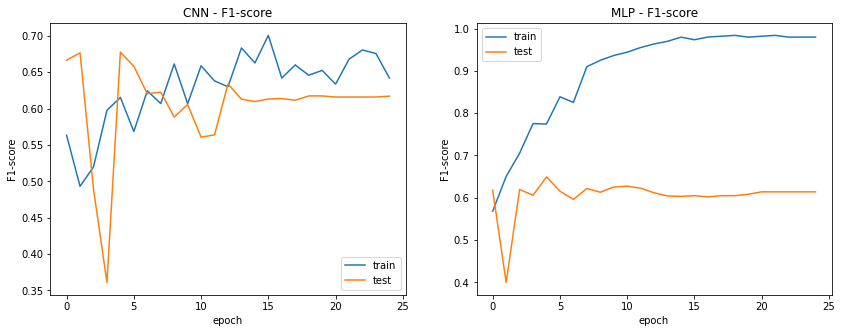

In [ ]:
plot_comparison(loss_train_cnn, loss_test_cnn, loss_train_mlp, loss_test_mlp, 'loss')
plot_comparison(accuracy_train_cnn, accuracy_test_cnn, accuracy_train_mlp, accuracy_test_mlp, 'accuracy')
plot_comparison(precision_train_cnn, precision_test_cnn, precision_train_mlp, precision_test_mlp, 'precision')
plot_comparison(recall_train_cnn, recall_test_cnn, recall_train_mlp, recall_test_mlp, 'recall')
plot_comparison(f1_train_cnn, f1_test_cnn, f1_train_mlp, f1_test_mlp, 'F1-score')

### Fine-tune pre-trained models

In [ ]:
# !unzip f'{data_datasets_path}hymenoptera/hymenoptera_data.zip' -d f'{data_datasets_path}hymenoptera'

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

image_datasets = {x: datasets.ImageFolder(f'{data_datasets_path}/hymenoptera/{x}', data_transforms[x]) for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'val']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

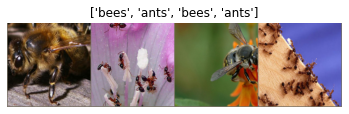

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.axis('off')
    plt.pause(0.001)

inputs, classes = next(iter(dataloaders['train']))
out = torchvision.utils.make_grid(inputs)
imshow(out, title=[class_names[x] for x in classes])

In [ ]:
def train_model(model, criterion, optimizer):
    model.train()
    running_loss = 0.0
    running_corrects = 0
    
    for inputs, labels in dataloaders['train']:
        inputs, labels = inputs.to(device), labels.to(device)
        
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)
        
    epoch_loss = running_loss / dataset_sizes['train']
    epoch_acc = running_corrects.double() / dataset_sizes['train']

    print(f'  TRAIN\t loss: {epoch_loss:.4f}  |  accuracy: {epoch_acc:.4f}')


def test_model(model, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    
    for inputs, labels in dataloaders['val']:
        inputs, labels = inputs.to(device), labels.to(device)
        
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)
        
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)
        
    epoch_loss = running_loss / dataset_sizes['val']
    epoch_acc = running_corrects.double() / dataset_sizes['val']

    print(f'  TEST\t loss: {epoch_loss:.4f}  |  accuracy: {epoch_acc:.4f}')


def visualize_model(model, num_images=6):
    model.eval()
    images_so_far = 0

    for i, (inputs, labels) in enumerate(dataloaders['val']):
        inputs, labels = inputs.to(device), labels.to(device)

        with torch.no_grad():
            outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(num_images//2, 2, images_so_far)
            ax.axis('off')
            ax.set_title(f'predicted: {class_names[preds[j]]}')
            imshow(inputs.cpu().data[j])

            if images_so_far == num_images:
                return

#### by freezing weights

In [ ]:
model_ft = models.resnet18(pretrained=True)
for param in model_ft.parameters():
    param.requires_grad = False

num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, 2)

model_ft = model_ft.to(device)

epochs = 15
criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [ ]:
for epoch in range(epochs):
    print('Epoch {}/{}'.format(epoch+1, epochs))
    train_model(model_ft, criterion, optimizer_ft)
    test_model(model_ft, criterion)
    scheduler.step()

Epoch 1/15
  TRAIN	 loss: 0.5396  |  accuracy: 0.7008
  TEST	 loss: 0.2116  |  accuracy: 0.9477
Epoch 2/15
  TRAIN	 loss: 0.6399  |  accuracy: 0.7049
  TEST	 loss: 0.1648  |  accuracy: 0.9477
Epoch 3/15
  TRAIN	 loss: 0.4076  |  accuracy: 0.8320
  TEST	 loss: 0.1787  |  accuracy: 0.9542
Epoch 4/15
  TRAIN	 loss: 0.3391  |  accuracy: 0.8525
  TEST	 loss: 0.2001  |  accuracy: 0.9346
Epoch 5/15
  TRAIN	 loss: 0.4234  |  accuracy: 0.8402
  TEST	 loss: 0.1439  |  accuracy: 0.9542
Epoch 6/15
  TRAIN	 loss: 0.3783  |  accuracy: 0.8361
  TEST	 loss: 0.1507  |  accuracy: 0.9542
Epoch 7/15
  TRAIN	 loss: 0.4892  |  accuracy: 0.7869
  TEST	 loss: 0.4210  |  accuracy: 0.8301
Epoch 8/15
  TRAIN	 loss: 0.4382  |  accuracy: 0.8074
  TEST	 loss: 0.1540  |  accuracy: 0.9608
Epoch 9/15
  TRAIN	 loss: 0.3382  |  accuracy: 0.8484
  TEST	 loss: 0.1947  |  accuracy: 0.9281
Epoch 10/15
  TRAIN	 loss: 0.2779  |  accuracy: 0.8648
  TEST	 loss: 0.1885  |  accuracy: 0.9346
Epoch 11/15
  TRAIN	 loss: 0.3605  |  a

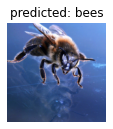

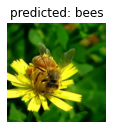

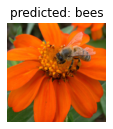

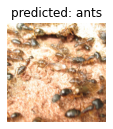

In [ ]:
visualize_model(model_ft, 4)

#### by reconstructing the layers

In [ ]:
alexnet = models.alexnet(pretrained=True)
print(alexnet)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
class MyAlexNET(nn.Module):
    def __init__(self):
        super(MyAlexNET, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2)),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False),
            nn.Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2)),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False),
            nn.Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
        )
        self.avgpool = nn.AdaptiveAvgPool2d(output_size=(6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=9216, out_features=4096, bias=True),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=4096, out_features=4096, bias=True),
            nn.ReLU(inplace=True),
            nn.Linear(in_features=4096, out_features=2, bias=True)
        )


    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return F.softmax(x, dim=1)

In [ ]:
model_myAlexNET = MyAlexNET()
print(model_myAlexNET)
model_myAlexNET = model_myAlexNET.to(device)

MyAlexNET(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)

In [ ]:
for epoch in range(epochs):
    print('Epoch {}/{}'.format(epoch+1, epochs))
    train_model(model_myAlexNET, criterion, optimizer_ft)
    test_model(model_myAlexNET, criterion)
    scheduler.step()

Epoch 1/15
  TRAIN	 loss: 0.6934  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 2/15
  TRAIN	 loss: 0.6931  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 3/15
  TRAIN	 loss: 0.6932  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 4/15
  TRAIN	 loss: 0.6935  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 5/15
  TRAIN	 loss: 0.6933  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 6/15
  TRAIN	 loss: 0.6933  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 7/15
  TRAIN	 loss: 0.6933  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 8/15
  TRAIN	 loss: 0.6932  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 9/15
  TRAIN	 loss: 0.6931  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 10/15
  TRAIN	 loss: 0.6931  |  accuracy: 0.5041
  TEST	 loss: 0.6939  |  accuracy: 0.4575
Epoch 11/15
  TRAIN	 loss: 0.6933  |  a

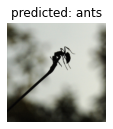

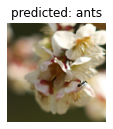

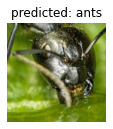

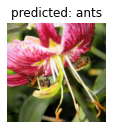

In [ ]:
visualize_model(model_myAlexNET, 4)

### Segmentation

#### Use Mask R-CNN to do instance segmentation 

In [6]:
coco_labels = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush' ]

colors = np.random.uniform(50, 150, (len(coco_labels), 3))

In [7]:
%%capture
model_rcnn = models.detection.maskrcnn_resnet50_fpn(pretrained=True, num_classes=len(coco_labels))
model_rcnn = model_rcnn.to(device)
model_rcnn.eval()

In [8]:
def get_segmentation(img, threshold):  
    transform = T.Compose([
        T.ToTensor()])

    img = transform(img)
    img = img.unsqueeze(0)
    img = img.to(device)
    
    with torch.no_grad():
        pred = model_rcnn(img)

    pred_scores = list(pred[0]['scores'].detach().cpu().numpy())
    pred_t = len([pred_scores.index(x) for x in pred_scores if x > threshold])

    masks = (pred[0]['masks'] > 0.5).squeeze().detach().cpu().numpy()
    masks = masks[:pred_t]

    boxes = [[int(i[0]), int(i[1]), int(i[2]), int(i[3])] for i in pred[0]['boxes'].detach().cpu()]
    boxes = boxes[:pred_t]

    classes = [coco_labels[i] for i in pred[0]['labels']]
    classes = classes[:pred_t]

    return masks, boxes, classes, pred_scores

In [9]:
def draw_segmentation(img, masks, boxes, classes, scores):
    alpha = 0.6
    beta = 0.6
    gamma = 0

    img = img.point(lambda p: p * alpha)
    img = np.array(img)

    for i in range(len(masks)):
        r = np.zeros_like(masks[i]).astype(np.uint8)
        g = np.zeros_like(masks[i]).astype(np.uint8)
        b = np.zeros_like(masks[i]).astype(np.uint8)
        color = colors[random.randrange(0, len(colors))]
        r[masks[i] == 1], g[masks[i] == 1], b[masks[i] == 1] = color
        rgb = np.stack([r, g, b], axis=2)
   
        cv2.addWeighted(img, 1, rgb, beta, gamma, img)

        p1 = (boxes[i][0], boxes[i][1])
        p2 = (boxes[i][2], boxes[i][3])
        cv2.rectangle(img, p1, p2, color=color, thickness=2)

        text = f'{classes[i]} {scores[i]:.2}'
        p_text = (boxes[i][0], boxes[i][1] + 10)
        cv2.putText(img, text, p_text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 1)

    return img

C:\Users\filip\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


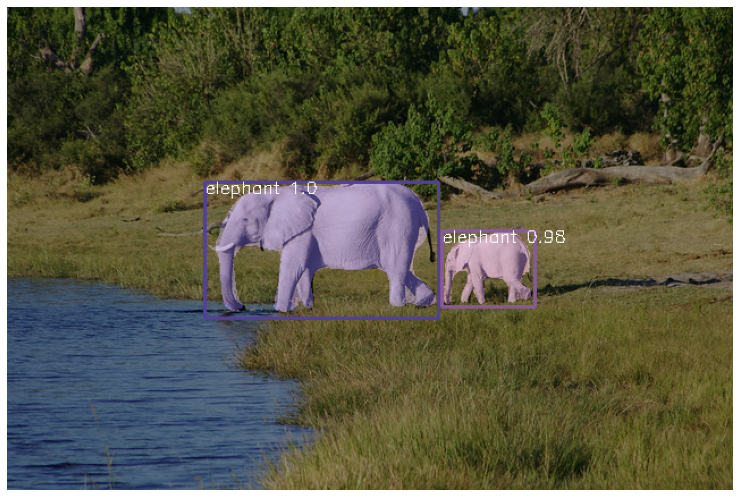

In [10]:
plt.figure(figsize=(13, 13))
img = Image.open(data_images_path + 'elephants.jpg')
img = img.convert('RGB')

masks, boxes, classes, scores = get_segmentation(img, 0.5)
img = draw_segmentation(img, masks, boxes, classes, scores)

plt.imshow(img); plt.axis('off'); plt.title(f''); plt.show()
plt.imsave('image_segmentation_elephants.png', img)

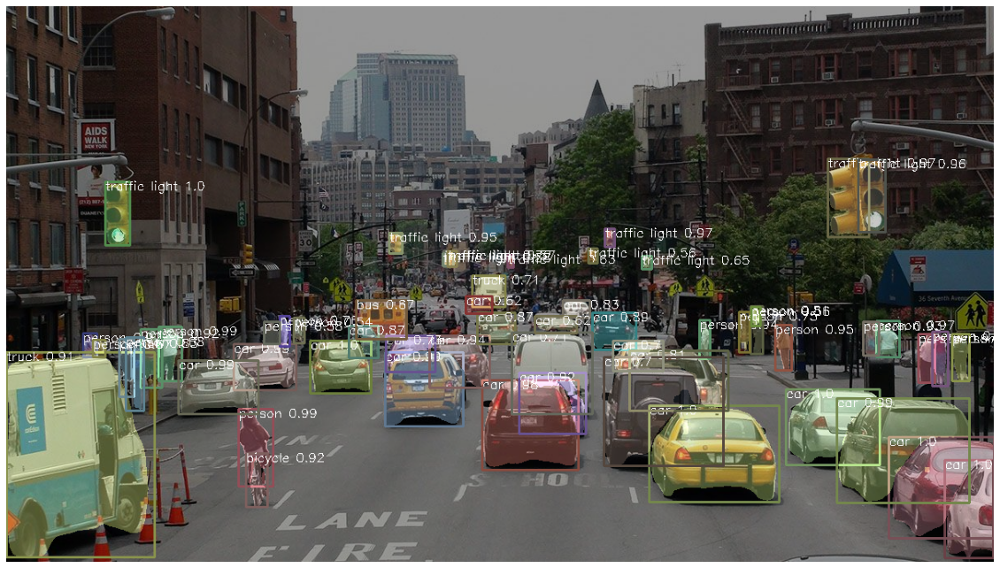

In [11]:
plt.figure(figsize=(20, 20))
img = Image.open(data_images_path + 'traffic_01.jpg')
img = img.convert('RGB')

masks, boxes, classes, scores = get_segmentation(img, 0.5)
img = draw_segmentation(img, masks, boxes, classes, scores)

plt.imshow(img); plt.axis('off'); plt.title(f''); plt.show()
plt.imsave('image_segmentation_traffic_01.png', img)

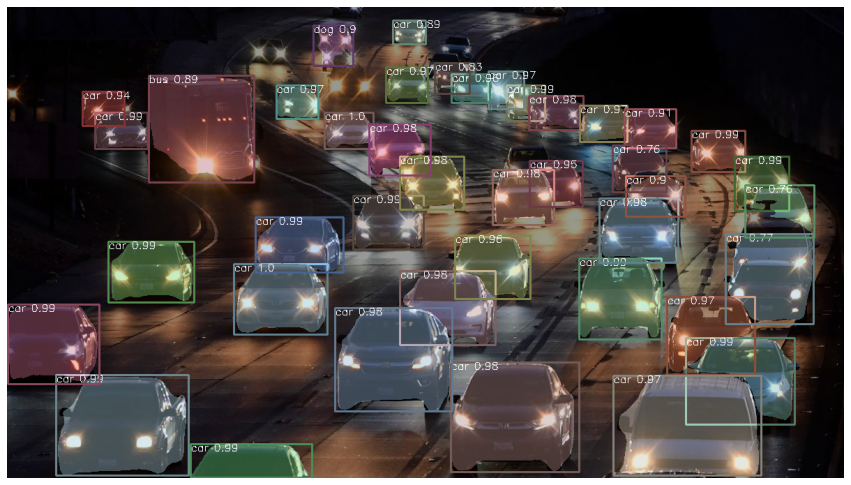

In [12]:
plt.figure(figsize=(15, 15))
img = Image.open(data_images_path + 'traffic_02.jpg')
img = img.convert('RGB')

masks, boxes, classes, scores = get_segmentation(img, 0.7)
img = draw_segmentation(img, masks, boxes, classes, scores)

plt.imshow(img); plt.axis('off'); plt.title(f''); plt.show()
plt.imsave('image_segmentation_traffic_02.png', img)

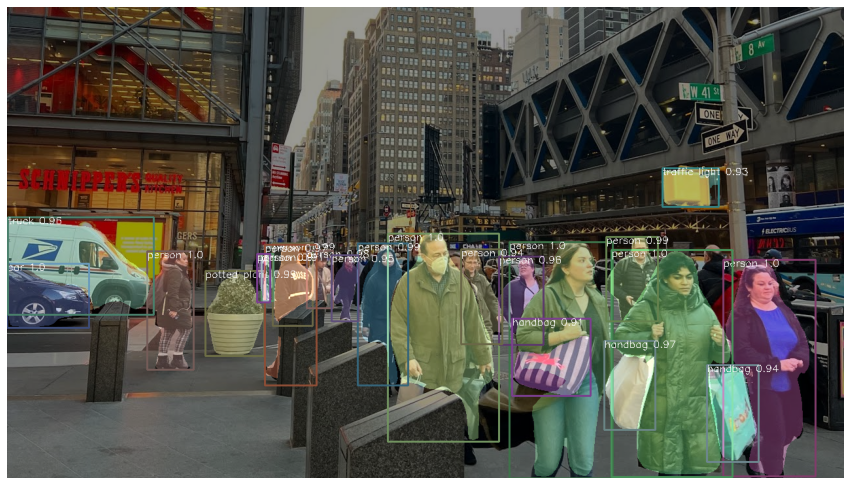

In [13]:
plt.figure(figsize=(15, 15))
img = Image.open(data_images_path + 'people_01.jpg')
img = img.convert('RGB')

masks, boxes, classes, scores = get_segmentation(img, 0.9)
img = draw_segmentation(img, masks, boxes, classes, scores)

plt.imshow(img); plt.axis('off'); plt.title(f''); plt.show()
plt.imsave('image_segmentation_people_01.png', img)

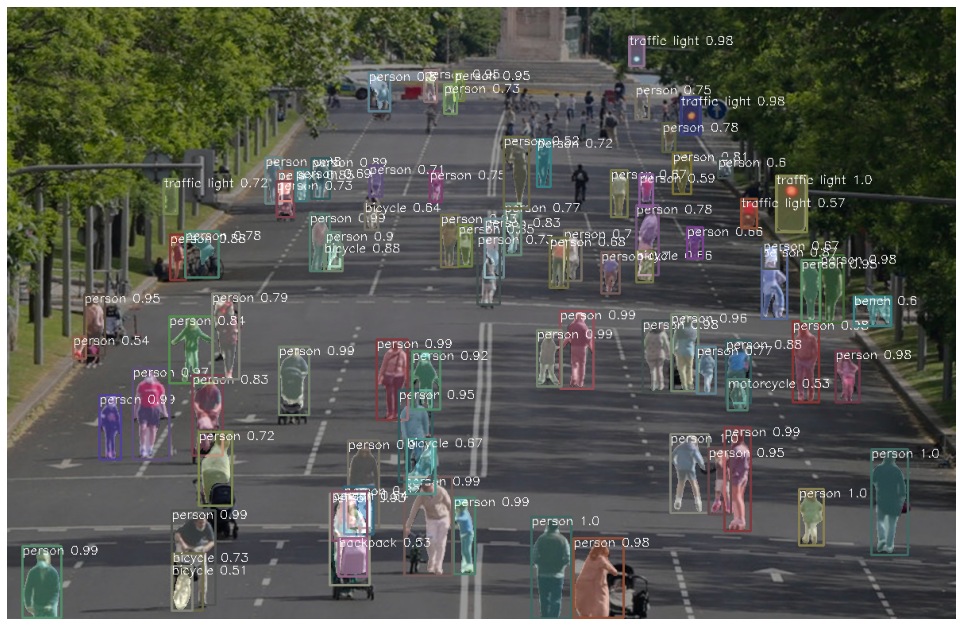

In [14]:
plt.figure(figsize=(17, 17))
img = Image.open(data_images_path + 'people_02.jpg')
img = img.convert('RGB')

masks, boxes, classes, scores = get_segmentation(img, 0.5)
img = draw_segmentation(img, masks, boxes, classes, scores)

plt.imshow(img); plt.axis('off'); plt.title(f''); plt.show()
plt.imsave('image_segmentation_people_02.png', img)

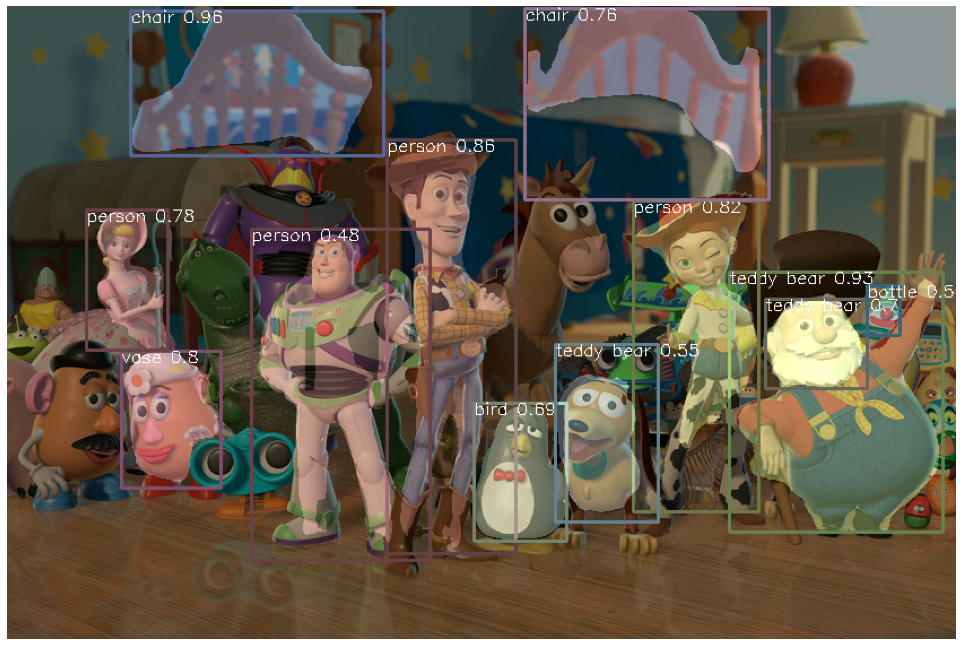

In [15]:
plt.figure(figsize=(17, 17))
img = Image.open(data_images_path + 'toy-story.jpg')
img = img.convert('RGB')

masks, boxes, classes, scores = get_segmentation(img, 0.45)
img = draw_segmentation(img, masks, boxes, classes, scores)

plt.imshow(img); plt.axis('off'); plt.title(f''); plt.show()
plt.imsave('image_segmentation_toy-story.png', img)

### CNN Visualization

#### Implement and apply occlusion to gather heatmap

In [16]:
model_resnet = models.resnet18(pretrained=True)

In [17]:
def test_single(img, label_index, show_top_k = False):
    transform = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])])

    img = transform(img)
    img = torch.unsqueeze(img, 0)

    model_resnet.eval()
    with torch.no_grad():
        output = model_resnet(img)

    k = 5
    ratios = F.softmax(output, dim=1)[0]
    topk_vals, topk_inds = ratios.topk(k)
    
    class_prob = ratios[label_index].item()

    if show_top_k:
        print(f'top {k}:')
        for i in range(k):
            print(f'[{i+1}]  {topk_inds[i]}  {topk_vals[i]:.4}')

        print(f'class probability (class {label_index}): {class_prob:.5}\n')

    return class_prob

In [42]:
def occlusion(img, label_index, occ_size, occ_stride, debug_box_index=-1):
    img_width, img_height = img.size[0], img.size[1]
    
    out_width = int(np.ceil((img_width-occ_size)/occ_stride))
    out_height = int(np.ceil((img_height-occ_size)/occ_stride))

    heatmap = torch.zeros((out_height, out_width))
    
    counter = 0

    for h in range(img_height):
        for w in range(img_width):

            h_start = h * occ_stride
            h_end = min(img_height, h_start + occ_size)

            w_start = w * occ_stride
            w_end = min(img_width, w_start + occ_size)

            if h_end >= img_height or w_end >= img_width:
                continue

            img_copy = img.copy()
            pixels = img_copy.load()

            for i in range(w_start, w_end):
                for j in range(h_start, h_end):
                    pixels[i, j] = (128, 128, 128)
            
            if counter == debug_box_index:
                plt.imshow(img_copy); plt.axis('off'); plt.show()
            counter += 1

            class_prob = test_single(img_copy, label_index)
            heatmap[h, w] = class_prob

            
    return heatmap

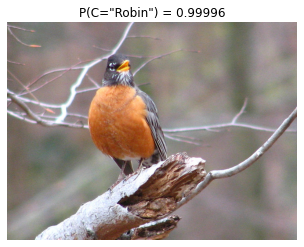

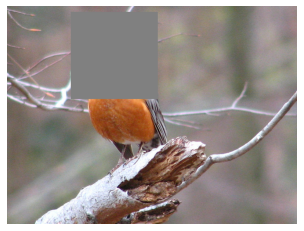

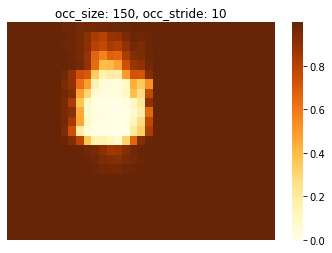

In [43]:
img = Image.open(data_images_path + 'robin.jpg')
class_index = 15
occ_size = 150
occ_stride = 10

P0 = test_single(img, class_index)
plt.imshow(img); plt.axis('off'); plt.title(f'P(C="Robin") = {P0:.5}'); plt.show()

occ_heatmap = occlusion(img, class_index, occ_size, occ_stride, 46)
heatmap = sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True))
plt.title(f'occ_size: {occ_size}, occ_stride: {occ_stride}')
heatmap.get_figure().savefig('occlusion_heatmap_robin', dpi=300)

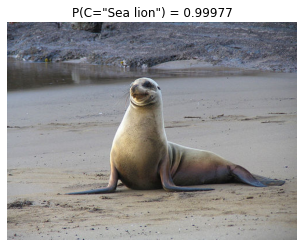

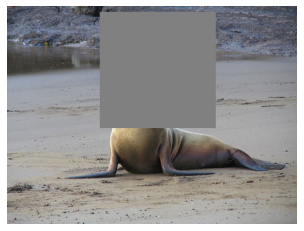

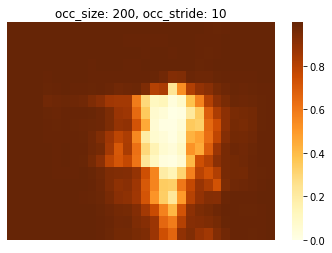

In [35]:
img = Image.open(data_images_path + 'sea_lion.jpg')
class_index = 150
occ_size = 200
occ_stride = 10

P0 = test_single(img, class_index)
plt.imshow(img); plt.axis('off'); plt.title(f'P(C="Sea lion") = {P0:.5}'); plt.show()

occ_heatmap = occlusion(img, class_index, occ_size, occ_stride, 46)
heatmap = sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True))
plt.title(f'occ_size: {occ_size}, occ_stride: {occ_stride}')
heatmap.get_figure().savefig('occlusion_heatmap_sea_lion', dpi=300)

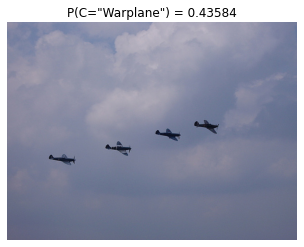

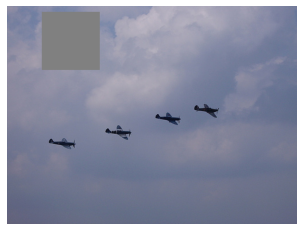

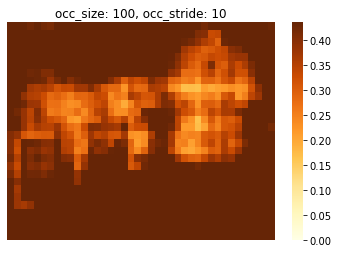

In [34]:
img = Image.open(data_images_path + 'warplane.jpg')
class_index = 895
occ_size = 100
occ_stride = 10

P0 = test_single(img, class_index)
plt.imshow(img); plt.axis('off'); plt.title(f'P(C="Warplane") = {P0:.5}'); plt.show()

occ_heatmap = occlusion(img, class_index, occ_size, occ_stride, 46)
heatmap = sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True))
plt.title(f'occ_size: {occ_size}, occ_stride: {occ_stride}')
heatmap.get_figure().savefig('occlusion_heatmap_warplane', dpi=300)

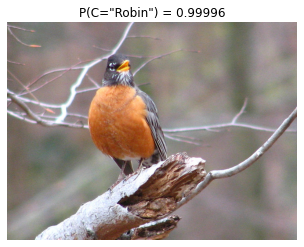

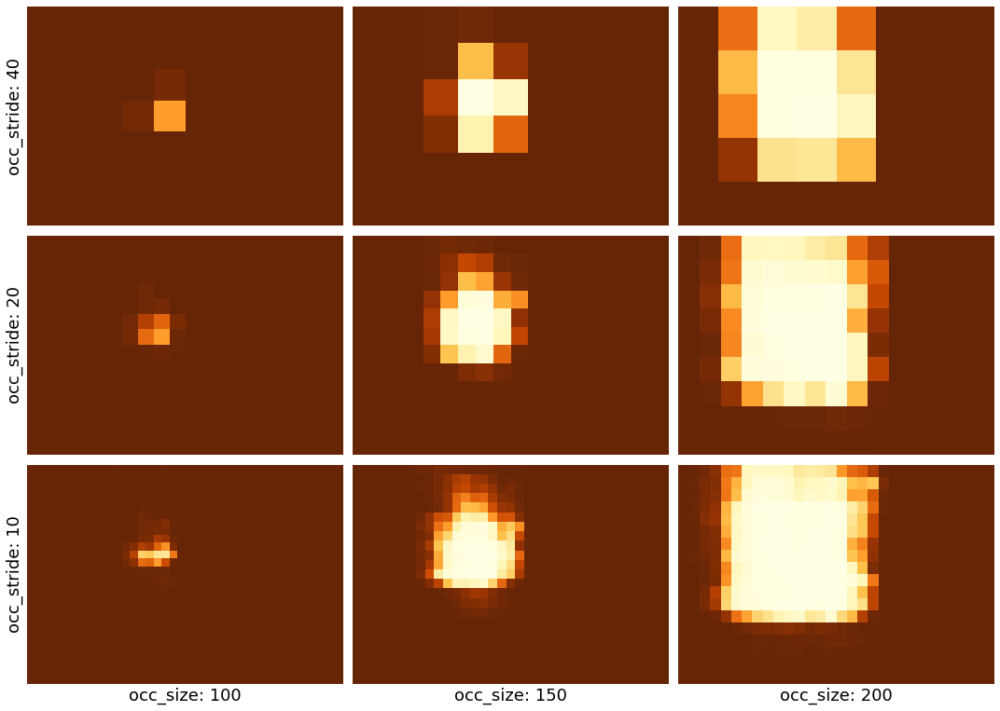

In [52]:
img = Image.open(data_images_path + 'robin.jpg')
class_index = 15
P0 = test_single(img, class_index)
plt.imshow(img); plt.axis('off'); plt.title(f'P(C="Robin") = {P0:.5}'); plt.show()


plt.figure(figsize=(15, 10.7))

plt.subplot(3, 3, 1)
occ_heatmap = occlusion(img, class_index, 100, 40)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)
plt.ylabel('occ_stride: 40', fontsize=18)

plt.subplot(3, 3, 2)
occ_heatmap = occlusion(img, class_index, 150, 40)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)

plt.subplot(3, 3, 3)
occ_heatmap = occlusion(img, class_index, 200, 40)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)

###

plt.subplot(3, 3, 4)
occ_heatmap = occlusion(img, class_index, 100, 20)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)
plt.ylabel('occ_stride: 20', fontsize=18)

plt.subplot(3, 3, 5)
occ_heatmap = occlusion(img, class_index, 150, 20)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)

plt.subplot(3, 3, 6)
occ_heatmap = occlusion(img, class_index, 200, 20)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)

###

plt.subplot(3, 3, 7)
occ_heatmap = occlusion(img, class_index, 100, 10)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)
plt.xlabel('occ_size: 100', fontsize=18)
plt.ylabel('occ_stride: 10', fontsize=18)

plt.subplot(3, 3, 8)
occ_heatmap = occlusion(img, class_index, 150, 10)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)
plt.xlabel('occ_size: 150', fontsize=18)

plt.subplot(3, 3, 9)
occ_heatmap = occlusion(img, class_index, 200, 10)
sns.heatmap(occ_heatmap, xticklabels=False, yticklabels=False, vmin=0, vmax=P0, cmap=sns.color_palette('YlOrBr', as_cmap=True), cbar=False)
plt.xlabel('occ_size: 200', fontsize=18)

plt.tight_layout()
plt.savefig('occlusion_settings_robin', dpi=300)

- - -
## Language Models

### Compare RNN, LSTM, and GRU with perplexity

In [4]:
def prepare_sequence(seq, to_ix):
    idxs = [to_ix[w] for w in seq]
    return torch.tensor(idxs, dtype=torch.long)


training_data = [
    # Tags are: DET - determiner; NN - noun; V - verb
    # For example, the word "The" is a determiner
    ("The dog ate the apple".split(), ["DET", "NN", "V", "DET", "NN"]),
    ("Everybody read that book".split(), ["NN", "V", "DET", "NN"]),
    ("Everybody does machine learning nowadays".split(), ["NN", "V", "NN", "NN", "ADV", ])
]
word_to_ix = {}
# For each words-list (sentence) and tags-list in each tuple of training_data
for sent, tags in training_data:
    for word in sent:
        if word not in word_to_ix:  # word has not been assigned an index yet
            word_to_ix[word] = len(word_to_ix)  # Assign each word with a unique index
            
print(word_to_ix)
tag_to_ix = {"DET": 0, "NN": 1, "V": 2, "ADV": 3}  # Assign each tag with a unique index

{'The': 0, 'dog': 1, 'ate': 2, 'the': 3, 'apple': 4, 'Everybody': 5, 'read': 6, 'that': 7, 'book': 8, 'does': 9, 'machine': 10, 'learning': 11, 'nowadays': 12}


In [5]:
EMBEDDING_DIM = 6
HIDDEN_DIM = 12
VOCAB_SIZE = len(word_to_ix)
NUM_CLASSES = len(tag_to_ix)

In [6]:
def train(model, optimizer, criterion, epochs):
    epoch_loss = []
    for epoch in range(epochs):
        final_loss = 0
        for sentence, tags in training_data:
            
            model.zero_grad()

            sentence_in = prepare_sequence(sentence, word_to_ix)
            targets = prepare_sequence(tags, tag_to_ix)

            tag_scores = model(sentence_in)
            
            loss = criterion(tag_scores, targets)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            final_loss += loss.item()
        epoch_loss.append(final_loss)
    
    return epoch_loss


def evaluate(model, test_sequence):
    with torch.no_grad():
        print(f"\nevaluate ({test_sequence}):")

        inputs = prepare_sequence(training_data[test_sequence][0], word_to_ix)
        tag_scores = model(inputs)

        print(" ", training_data[test_sequence][0])
        print(" ", training_data[test_sequence][1])
        
        outputs = []
        for tag_score in tag_scores:
            outputs.append(tag_score.topk(1).indices.item())
        print(" ", outputs)
            
        p = F.softmax(tag_scores, dim=1).flatten().numpy()
        perplexity = 2 ** (-sum(p*np.log2(p)))
        print(f"  perplexity: {perplexity:.3f}")


#### Recurrent Neural Networks (RNN) 

In [7]:
class RNNTagger(nn.Module):

    def __init__(self, embedding_dim, hidden_dim, vocab_size, tagset_size):
        super(RNNTagger, self).__init__()
        self.hidden_dim = hidden_dim
        self.word_embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.rnn = nn.RNN(embedding_dim, hidden_dim)
        self.hidden2tag = nn.Linear(hidden_dim, tagset_size)

    def forward(self, sentence):      
        embeds = self.word_embeddings(sentence)
        rnn_out, _ = self.rnn(embeds.view(len(sentence), 1, -1)) 
        tag_space = self.hidden2tag(rnn_out.view(len(sentence), -1))    
        tag_scores = F.log_softmax(tag_space, dim=1)
        return tag_scores

In [8]:
model = RNNTagger(EMBEDDING_DIM, HIDDEN_DIM, len(word_to_ix), len(tag_to_ix))
loss_function = nn.NLLLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1)
losses = train(model, optimizer, loss_function, 100)
print(losses)
evaluate(model, 0)
evaluate(model, 1)
evaluate(model, 2)

[3.9605493545532227, 3.7368240356445312, 3.5644737482070923, 3.4232168197631836, 3.299973249435425, 3.185865104198456, 3.0749910473823547, 2.9636698365211487, 2.8497942090034485, 2.732282876968384, 2.6106712222099304, 2.4848744869232178, 2.3550938963890076, 2.2218181490898132, 2.0858590602874756, 1.9483829140663147, 1.8108853101730347, 1.675080120563507, 1.5427024066448212, 1.4152962565422058, 1.2940855622291565, 1.1799475848674774, 1.0734542906284332, 0.9749294221401215, 0.8845004439353943, 0.8021363615989685, 0.7276725023984909, 0.6608202457427979, 0.6011748760938644, 0.5482301115989685, 0.5014048963785172, 0.46007829904556274, 0.4236255884170532, 0.3914481922984123, 0.3629933074116707, 0.3377653881907463, 0.3153284937143326, 0.29530488699674606, 0.27737004309892654, 0.26124702394008636, 0.24669945240020752, 0.23352627456188202, 0.22155633941292763, 0.21064309403300285, 0.20066173002123833, 0.19150486215949059, 0.18308000639081, 0.17530753463506699, 0.1681181788444519, 0.161451742053

#### Long Short-Term Memory (LSTM)

In [9]:
class LSTMTagger(nn.Module):

    def __init__(self, embedding_dim, hidden_dim, vocab_size, tagset_size):
        super(LSTMTagger, self).__init__()
        self.hidden_dim = hidden_dim
        self.word_embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim)
        self.hidden2tag = nn.Linear(hidden_dim, tagset_size)

    def forward(self, sentence):
        embeds = self.word_embeddings(sentence)
        lstm_out, _ = self.lstm(embeds.view(len(sentence), 1, -1))
        tag_space = self.hidden2tag(lstm_out.view(len(sentence), -1))
        tag_scores = F.log_softmax(tag_space, dim=1)
        return tag_scores

In [10]:
model = LSTMTagger(EMBEDDING_DIM, HIDDEN_DIM, len(word_to_ix), len(tag_to_ix))
loss_function = nn.NLLLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1)
losses = train(model, optimizer, loss_function, 100)
print(losses)
evaluate(model, 0)
evaluate(model, 1)
evaluate(model, 2)

[3.9009039402008057, 3.8105908632278442, 3.733860731124878, 3.667958974838257, 3.610627055168152, 3.5600223541259766, 3.5146484375, 3.4732980728149414, 3.434999704360962, 3.398977041244507, 3.3646109104156494, 3.331411361694336, 3.2989920377731323, 3.2670533657073975, 3.2353627681732178, 3.2037460803985596, 3.172075033187866, 3.1402599811553955, 3.1082417964935303, 3.0759869813919067, 3.0434802770614624, 3.0107235312461853, 2.9777278304100037, 2.944515109062195, 2.9111098647117615, 2.8775423169136047, 2.8438438177108765, 2.8100459575653076, 2.776180624961853, 2.74227774143219, 2.7083659768104553, 2.674471378326416, 2.6406168341636658, 2.60682213306427, 2.5731034874916077, 2.539473235607147, 2.50593900680542, 2.4725047945976257, 2.439170181751251, 2.4059298634529114, 2.3727744817733765, 2.339690089225769, 2.3066590428352356, 2.273659348487854, 2.2406651377677917, 2.2076475024223328, 2.1745742559432983, 2.141410529613495, 2.1081201434135437, 2.0746652483940125, 2.0410091876983643, 2.0071

#### Implement GRU in the first Notebook

In [11]:
class GRUTagger(nn.Module):
    
    def __init__(self, embedding_dim, hidden_dim, vocab_size, tagset_size):
        super(GRUTagger, self).__init__()
        self.hidden_dim = hidden_dim
        self.word_embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.gru = nn.GRU(embedding_dim, hidden_dim)
        self.hidden2tag = nn.Linear(hidden_dim, tagset_size)

    def forward(self, sentence):
        embeds = self.word_embeddings(sentence)
        gru_out, _ = self.gru(embeds.view(len(sentence), 1, -1))
        tag_space = self.hidden2tag(gru_out.view(len(sentence), -1))
        tag_scores = F.log_softmax(tag_space, dim=1)
        return tag_scores

In [12]:
model = GRUTagger(EMBEDDING_DIM, HIDDEN_DIM, len(word_to_ix), len(tag_to_ix))
loss_function = nn.NLLLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1)
losses = train(model, optimizer, loss_function, 100)
print(losses)
evaluate(model, 0)
evaluate(model, 1)
evaluate(model, 2)

[4.162321448326111, 4.012684106826782, 3.8929752111434937, 3.7966909408569336, 3.718604803085327, 3.654433012008667, 3.6006743907928467, 3.5545135736465454, 3.5137321949005127, 3.4766193628311157, 3.441878080368042, 3.408537268638611, 3.3758751153945923, 3.343356132507324, 3.3105833530426025, 3.27725887298584, 3.2431600093841553, 3.2081179022789, 3.1720050573349, 3.134725332260132, 3.096207916736603, 3.0564024448394775, 3.0152745246887207, 2.9728042483329773, 2.928983151912689, 2.883811295032501, 2.837297201156616, 2.7894541025161743, 2.7403011322021484, 2.689860165119171, 2.638157069683075, 2.585221529006958, 2.5310853719711304, 2.4757864475250244, 2.419366240501404, 2.3618730902671814, 2.3033628463745117, 2.2439004778862, 2.1835615634918213, 2.122434675693512, 2.060623049736023, 1.9982449114322662, 1.9354355931282043, 1.8723472356796265, 1.8091471195220947, 1.746016949415207, 1.68314790725708, 1.6207373142242432, 1.5589831173419952, 1.498076617717743, 1.4381983578205109, 1.3795112073

### Implement Skip-gram and compare embedding layers with CBOW

In [13]:
CONTEXT_SIZE = 2

raw_text= """Long Short-Term Memory (LSTM) is a recurrent neural network (RNN) architecture that has been designed
to address the vanishing and exploding gradient problems of conventional RNNs. Unlike feedforward neural networks,
RNNs have cyclic connections making them powerful for modeling sequences. 
They have been successfully used for sequence labeling and sequence prediction tasks,
such as handwriting recognition, language modeling, phonetic labeling of acoustic frames. However, in contrast to the deep neural
networks, the use of RNNs in speech recognition has been limited to phone recognition in small scale tasks. 
In this paper, we present novel LSTM based RNN architectures which make more effective
use of model parameters to train acoustic models for large vocabulary speech recognition. 
We train and compare LSTM, RNN and DNN models at various numbers of parameters and configurations.
We show that LSTM models converge quickly and give state of the art speech recognition performance for relatively small sized models.""".split()

# By deriving a set from "raw_text", we deduplicate the array
vocab = set(raw_text)
VOCAB_SIZE = len(vocab)

# Basic Tokenizer
word_to_ix = {word: i for i, word in enumerate(vocab)}

print('words in raw_text:', len(raw_text))
print('unique words:', VOCAB_SIZE)

words in raw_text: 152
unique words: 106


In [14]:
data = []
for i in range(CONTEXT_SIZE, len(raw_text) - CONTEXT_SIZE):
    context = []
    for j in range(CONTEXT_SIZE, 0, -1):
        context.append(raw_text[i - j])

    for j in range(1, CONTEXT_SIZE + 1):
        context.append(raw_text[i + j])
        
    target = raw_text[i]
    data.append((context, target))

print(data[:5])

[(['Long', 'Short-Term', '(LSTM)', 'is'], 'Memory'), (['Short-Term', 'Memory', 'is', 'a'], '(LSTM)'), (['Memory', '(LSTM)', 'a', 'recurrent'], 'is'), (['(LSTM)', 'is', 'recurrent', 'neural'], 'a'), (['is', 'a', 'neural', 'network'], 'recurrent')]


In [15]:
class SkipGram(nn.Module):
    def __init__(self, vocab_size, embed_dim, context_size):
        super(SkipGram, self).__init__()
        self.context_size = context_size
        self.embed = nn.Embedding(vocab_size, embed_dim)
        self.linear1 = nn.Linear(embed_dim, 128)
        self.linear2 = nn.Linear(128, context_size*vocab_size)

    def forward(self, x):
        x = self.embed(x)
        x = x.view(1, -1)
        x = self.linear1(x)
        x = F.relu(x)  
        x = self.linear2(x)
        x = F.log_softmax(x, dim=1)
        x = x.view(self.context_size, -1)
        return x

In [16]:
def context_to_indices(context):
    idxs = [word_to_ix[w] for w in context]
    return torch.tensor(idxs, dtype=torch.long)

def indices_to_context(idxs):
    keys = list(word_to_ix.keys())
    context = [keys[i] for i in idxs]
    return context

def target_to_index(target):
    idx = word_to_ix[target]
    return torch.tensor(idx, dtype=torch.long)

def index_to_target(idx):
    keys = list(word_to_ix.keys())
    target = keys[idx]
    return target

print(context_to_indices(data[0][0]))
print(target_to_index(data[0][1]))
print(indices_to_context([103, 93, 24, 54]))
print(index_to_target(103))

tensor([18, 22, 85, 77])
tensor(1)
['present', 'scale', 'recurrent', 'tasks.']
present


In [17]:
def train(model, epoch, data, optimizer, loss_function):
    model.train()

    total_loss = 0
    for context, target in data:    
        context_idxs = context_to_indices(context)
        #context_idxs = context_idxs.to(device)
        target_idx = target_to_index(target)
        #target_idx = target_idx.to(device)

        model.zero_grad()
        log_probs = model(target_idx)
        loss = loss_function(log_probs, context_idxs)

        loss.backward()
        optimizer.step()

        total_loss += loss

    if (epoch+1) % 10 == 0:
        avg_loss = total_loss / len(data)
        print(f'epoch: {epoch+1}  |  total loss: {total_loss:.4f}  |  average loss: {avg_loss:.4f}')

In [18]:
EMBEDD_DIM = 10
epochs = 500
loss_function = nn.NLLLoss()
model_skipGram = SkipGram(VOCAB_SIZE, EMBEDD_DIM, CONTEXT_SIZE*2)
# model = model.to(device)
optimizer = optim.SGD(model_skipGram.parameters(), lr=0.001)

for epoch in range(epochs):
    train(model_skipGram, epoch, data, optimizer, loss_function)

epoch: 10  |  total loss: 893.4053  |  average loss: 6.0365
epoch: 20  |  total loss: 886.0692  |  average loss: 5.9870
epoch: 30  |  total loss: 878.8784  |  average loss: 5.9384
epoch: 40  |  total loss: 871.7620  |  average loss: 5.8903
epoch: 50  |  total loss: 864.6660  |  average loss: 5.8423
epoch: 60  |  total loss: 857.5418  |  average loss: 5.7942
epoch: 70  |  total loss: 850.3544  |  average loss: 5.7456
epoch: 80  |  total loss: 843.0692  |  average loss: 5.6964
epoch: 90  |  total loss: 835.6675  |  average loss: 5.6464
epoch: 100  |  total loss: 828.1312  |  average loss: 5.5955
epoch: 110  |  total loss: 820.4599  |  average loss: 5.5436
epoch: 120  |  total loss: 812.6502  |  average loss: 5.4909
epoch: 130  |  total loss: 804.7017  |  average loss: 5.4372
epoch: 140  |  total loss: 796.6133  |  average loss: 5.3825
epoch: 150  |  total loss: 788.3766  |  average loss: 5.3269
epoch: 160  |  total loss: 779.9863  |  average loss: 5.2702
epoch: 170  |  total loss: 771.43

In [19]:
%%capture
"""Long Short-Term Memory (LSTM) is a recurrent neural network (RNN) architecture that has been designed
to address the vanishing and exploding gradient problems of conventional RNNs. Unlike feedforward neural networks,
RNNs have cyclic connections making them powerful for modeling sequences. 
They have been successfully used for sequence labeling and sequence prediction tasks,
such as handwriting recognition, language modeling, phonetic labeling of acoustic frames. However, in contrast to the deep neural
networks, the use of RNNs in speech recognition has been limited to phone recognition in small scale tasks. 
In this paper, we present novel LSTM based RNN architectures which make more effective
use of model parameters to train acoustic models for large vocabulary speech recognition. 
We train and compare LSTM, RNN and DNN models at various numbers of parameters and configurations.
We show that LSTM models converge quickly and give state of the art speech recognition performance for relatively small sized models."""

In [20]:
def predict_context(target):
    target_idx = target_to_index(target)
    output = model_skipGram(target_idx)

    context = []
    accuracies = []
    for c in range(CONTEXT_SIZE*2):
        ratios = F.softmax(output, dim=1)[c]
        top1_val, top1_ind = ratios.topk(1)
        accuracies.append(top1_val.item())
        context.append(index_to_target(top1_ind))
    
    str = 'predicted context:\t'
    for c in range(CONTEXT_SIZE*2):   
        if (c == CONTEXT_SIZE):
            str += f'\033[1m{target}\033[0m   '
        str += f'\033[4m{context[c]}\033[0m   ' + ' ' * max(4-len(context[c]), 0)
    print(str)
    
    str = 'accuracies:\t\t'
    for c in range(CONTEXT_SIZE*2):   
        if (c == CONTEXT_SIZE):
            str += f'\033[1m{target}\033[0m   ' 
        str += f'{accuracies[c]:.2f}   '  + ' ' * max(len(context[c])-4, 0)
    print(str, '\n')
    # print(f'target: \'{target}\',  context: {context},  accuracies: {accuracies}')

predict_context('recurrent')
predict_context('prediction')
predict_context('LSTM')

predicted context:	is     a      recurrent   neural   network   
accuracies:		0.51   0.44   recurrent   0.56     0.51       

predicted context:	and    sequence   prediction   tasks,   such   
accuracies:		0.54   0.44       prediction   0.44     0.35    

predicted context:	show   novel   LSTM   based   converge   
accuracies:		0.14   0.14    LSTM   0.13    0.19        



### Adapt/expand the text classifier in notebook 2 within the language models lab

In [622]:
from datasets import load_dataset
dataset_news = load_dataset('ag_news')

print(dataset_news)

Using custom data configuration default
Reusing dataset ag_news (C:\Users\filip\.cache\huggingface\datasets\ag_news\default\0.0.0\bc2bcb40336ace1a0374767fc29bb0296cdaf8a6da7298436239c54d79180548)
100%|██████████| 2/2 [00:00<00:00, 74.10it/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 120000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 7600
    })
})


In [625]:
labels = {
    0: 'World',
    1: 'Sports',
    2: 'Business',
    3: 'Sci/Tech',
}
n_labels = 4

def index_to_label(idx):
    return labels[idx]


print('\033[1m{}\033[0m \n{}\n'.format(index_to_label(dataset_news['train']['label'][500]), dataset_news['train']['text'][500]))
print('\033[1m{}\033[0m \n{}\n'.format(index_to_label(dataset_news['train']['label'][450]), dataset_news['train']['text'][450]))
print('\033[1m{}\033[0m \n{}\n'.format(index_to_label(dataset_news['train']['label'][0]), dataset_news['train']['text'][0]))
print('\033[1m{}\033[0m \n{}\n'.format(index_to_label(dataset_news['train']['label'][150]), dataset_news['train']['text'][150]))

World 
Kerry Campaign Helping With Fla. Recovery (AP) AP - Democratic presidential candidate John Kerry does not plan to visit Florida in the aftermath of Hurricane Charley because he's concerned his campaign entourage could distract from recovery efforts, he said Saturday.

Sports 
Dreaming done, NBA stars awaken to harsh Olympic reality (AFP) AFP - National Basketball Association players trying to win a fourth consecutive Olympic gold medal for the United States have gotten the wake-up call that the "Dream Team" days are done even if supporters have not.

Business 
Wall St. Bears Claw Back Into the Black (Reuters) Reuters - Short-sellers, Wall Street's dwindling\band of ultra-cynics, are seeing green again.

Sci/Tech 
Annual Study Finds Rise in Beach Closures (AP) AP - The number of days that beaches closed or posted warnings because of pollution rose sharply in 2003 due to more rainfall, increased monitoring and tougher standards, an environmental group said on Thursday.



In [133]:
contractions = {
"are not" : ["are", "not"],
"ca" : ["can"],
"couldn't" : ["could", "not"],
"didn't" : ["did", "not"],
"doesn't" : ["does", "not"],
"don't" : ["do", "not"],
"hadn't" : ["had", "not"],
"hasn't" : ["has", "not"],
"haven't" : ["have", "not"],
"he'd" : ["he", "would"],
"he'll" : ["he", "will"],
"he's" : ["he", "is"],
"i'd" : ["i", "would"],
"i'd" : ["i", "had"],
"i'll" : ["i", "will"],
"i'm" : ["i", "am"],
"isn't" : ["is", "not"],
"it's" : ["it", "is"],
"it'll" : ["it", "will"],
"i've" : ["i", "have"],
"let's" : ["let", "us"],
"mightn't" : ["might", "not"],
"mustn't" : ["must", "not"],
"sha" : ["shall"],
"she'd" : ["she", "would"],
"she'll" : ["she", "will"],
"she's" : ["she", "is"],
"shouldn't" : ["should", "not"],
"that's" : ["that", "is"],
"there's" : ["there", "is"],
"they'd" : ["they", "would"],
"they'll" : ["they", "will"],
"they're" : ["they", "are"],
"they've" : ["they", "have"],
"we'd" : ["we", "would"],
"we're" : ["we", "are"],
"weren't" : ["were", "not"],
"we've" : ["we", "have"],
"what'll" : ["what", "will"],
"what're" : ["what", "are"],
"what's" : ["what", "is"],
"what've" : ["what", "have"],
"where's" : ["where", "is"],
"who'd" : ["who", "would"],
"who'll" : ["who", "will"],
"who're" : ["who", "are"],
"who's" : ["who", "is"],
"who've" : ["who", "have"],
"wo" : ["will"],
"wouldn't" : ["would", "not"],
"you'd" : ["you", "would"],
"you'll" : ["you", "will"],
"you're" : ["you", "are"],
"you've" : ["you", "have"],
"'re":  ["are"],
"wasn't": ["was", "not"],
"we'll": ["we", "will"],
"didn't": ["did", "not"],
}

In [638]:
regex = "[\w']+"

test1 = 'aaa bbb. ccc,, ddd;eee fff-ggg hhh - iii/jjj\kkk\'lll.mmm?nnn!ooo "ppp" (qqq) *rrr* sss:ttt'
test2 = "isn't you're he'd he'll he's i'm hello"
test3 = 'bears'

def tokenize(sentence):
    tokens = []
    for w in re.findall(regex, sentence):
        w_lower = str.lower(w)
        if (w_lower in contractions):
            tokens.extend(contractions[w_lower])
        else:
            tokens.append(w_lower)

    return tokens

print(tokenize(test1))
print(tokenize(test2))
print(tokenize(test3))

['aaa', 'bbb', 'ccc', 'ddd', 'eee', 'fff', 'ggg', 'hhh', 'iii', 'jjj', "kkk'lll", 'mmm', 'nnn', 'ooo', 'ppp', 'qqq', 'rrr', 'sss', 'ttt']
['is', 'not', 'you', 'are', 'he', 'would', 'he', 'will', 'he', 'is', 'i', 'am', 'hello']
['bears']


In [707]:
all_words = []
all_news = []

for sentence in dataset_news['train']['text']:
    tokens = tokenize(sentence)
    all_words.extend(tokens)
    all_news.append(tokens)


print(all_words[:50])
print('\ntotal number of words:', len(all_words))

unique_words = Counter(all_words)
print('\033[4m{: <15} {: >15}\033[0m'.format('word', '#occurrences'))
for i, key in enumerate(unique_words):
    if i == 5:
        break
    print('{: <15} {: >15}'.format(key, unique_words[key]))
print('\ntotal number of unique words: ', len(unique_words), '\n')



news = []
for i in range(n_labels):
    news.append(np.array(all_news, dtype=object)[np.array(dataset_news['train']['label']) == i])

# print('\033[4m{: <15} {: >15}\033[0m'.format('label', '#news articles'))
# for i in range(n_labels):
#     print('{: <15} {: >15}'.format(index_to_label(i), len(news[i])))


category_counts = []
for i in range(n_labels):
    category_words = []
    for j in range(len(news[i])):
        category_words.extend(news[i][j])

    category_count = Counter(category_words)

    tmp = []
    for j, w in enumerate(unique_words):
        if (w in category_count):
            tmp.append(category_count[w])
        else:
            tmp.append(0)
    category_counts.append(tmp)


counts = [0]*4
tmp = []
unique_threshold = 0.9
count_threshold = 3

print('extracting keywords...')
print(f'removing all words appearing less than {count_threshold} times...\n')


print('\033[4m{: <20} {: <15} {: <15} {: <15} {: <15}\033[0m'.format('word', 'World', 'Sports', 'Business', 'Sci/Tech'))
for i, w in enumerate(unique_words):
    total_count = category_counts[0][i] + category_counts[1][i] + category_counts[2][i] + category_counts[3][i]

    if total_count < count_threshold:
        continue

    print('{: <20} {: <15} {: <15} {: <15} {: <15}'.format(w, f'{category_counts[0][i] / total_count:.2f}', f'{category_counts[1][i] / total_count:.2f}', f'{category_counts[2][i] / total_count:.2f}', f'{category_counts[3][i] / total_count:.2f}'))

    for j in range(n_labels):
        ratio = category_counts[j][i] / total_count
        if (ratio >= unique_threshold):
            counts[j] += 1
            tmp.append(w)
            continue

print('\n{: <20} {: <15} {: <15} {: <15} {: <15}'.format('category:', 'World', 'Sports', 'Business', 'Sci/Tech'))
print('{: <20} {: <15} {: <15} {: <15} {: <15}'.format('#keywords:', counts[0], counts[1], counts[2], counts[3]))

print('total number of unique words: ', len(tmp), '\n')


unique_words = tmp
n_unique_words = len(unique_words)

['wall', 'st', 'bears', 'claw', 'back', 'into', 'the', 'black', 'reuters', 'reuters', 'short', 'sellers', 'wall', "street's", 'dwindling', 'band', 'of', 'ultra', 'cynics', 'are', 'seeing', 'green', 'again', 'carlyle', 'looks', 'toward', 'commercial', 'aerospace', 'reuters', 'reuters', 'private', 'investment', 'firm', 'carlyle', 'group', 'which', 'has', 'a', 'reputation', 'for', 'making', 'well', 'timed', 'and', 'occasionally', 'controversial', 'plays', 'in', 'the', 'defense']

total number of words: 4737885
word               #occurrences
wall                       1422
st                         1424
bears                       392
claw                         17
back                       4488

total number of unique words:  70323 

extracting keywords...
removing all words appearing less than 3 times...

word                 World           Sports          Business        Sci/Tech       
wall                 0.10            0.03            0.78            0.10           
st         

In [682]:
def word_to_index(word):
    if word in unique_words:
        return unique_words.index(word)
    else:
        return -1

def sentence_vector_to_tensor(tokens):
    tensor = torch.zeros(len(tokens), 1, n_unique_words)
    for i, word in enumerate(tokens):
        idx = word_to_index(word)
        if idx != -1:
            tensor[i][0][idx] = 1  
    return tensor

def sentence_to_tensor(sentence):
    tokens = tokenize(sentence)
    return sentence_vector_to_tensor(tokens)


print('index:', word_to_index('bears'))
print('tensor:', sentence_to_tensor('bears'), '\n')

print(sentence_to_tensor('wall st. bears claw back into the black (reuters) reuters').size())

index: 2
tensor: tensor([[[0., 0., 1.,  ..., 0., 0., 0.]]]) 

torch.Size([10, 1, 24768])


In [717]:
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(RNN, self).__init__()

        self.hidden_size = hidden_size

        self.hidden_comp = nn.Linear(input_size + hidden_size, hidden_size)
        self.output_comp = nn.Linear(input_size + hidden_size, hidden_size)
        self.output2output = nn.Linear(hidden_size, output_size)
        self.tanh_act = nn.Tanh()
        self.lsoftmax = nn.LogSoftmax(dim=1)


    def forward(self, x, hidden):
        # print(x.shape)
        # print(hidden.shape)
        
        combined = torch.cat((x, hidden), 1)
        hidden = self.hidden_comp(combined)
        hidden = self.tanh_act(hidden)
        # print(hidden.shape)

        output = self.output_comp(combined)
        output = self.tanh_act(output)
        # print(output.shape)
        output = self.output2output(output)
        output = self.lsoftmax(output)
        # print(output.shape)    
        return output, hidden


    def initHidden(self):
        return torch.zeros(1, self.hidden_size)


n_hidden = 128
model_rnn = RNN(n_unique_words, n_hidden, n_labels)

In [718]:
x = sentence_to_tensor('bears')
hidden = model_rnn.initHidden()

output, next_hidden = model_rnn(x[0], hidden)
print(output.argmax(-1))
print(output.topk(4).indices, '\n')

tensor([1])
tensor([[1, 3, 0, 2]]) 



In [719]:
def output_to_label_index(output):
    return output.argmax(-1).item()

print(output_to_label_index(output))

1


In [720]:
def random_label_index():
    return random.randint(0, n_labels-1)

def random_news(label_index):
    return news[label_index][random.randint(0, len(news[label_index])-1)]

def random_news_sample():
    label_index = random_label_index()
    news_text = random_news(label_index)
    label_tensor = torch.tensor(label_index, dtype=torch.long)
    news_tensor = sentence_vector_to_tensor(news_text)
    return label_index, news_text, label_tensor, news_tensor


for i in range(3):
    label_index, news_text, label_tensor, news_tensor = random_news_sample()
    print(f'\033[1m{index_to_label(label_index)}\033[0m\n{news_text}\n')

Sports
['brown', 'returns', 'to', 'steer', 'pistons', 'past', 'timberwolves', 'there', 'was', 'an', 'elevated', 'chair', 'in', 'front', 'of', 'the', 'detroit', 'pistons', 'bench', 'for', 'head', 'coach', 'larry', 'brown', 'and', 'his', 'still', 'on', 'the', 'mend', 'left', 'hip', 'it', 'was', 'there', 'to', 'provide', 'him', 'with', 'added']

Business
['jpmorgan', 'chase', 'cancels', 'ibm', 'outsourcing', 'contract', 'jpmorgan', 'chase', 'announced', 'on', 'wednesday', 'that', 'it', 'will', 'cancel', 'its', 'multiyear', '5', 'billion', 'outsourcing', 'contract', 'with', 'ibm', 'bucking', 'an', 'industry', 'trend', 'that', 'has', 'seen', 'it', 'outsourcing', 'grow', 'by', 'dramatic', 'proportions']

Sci/Tech
['samoa', 'plans', 'internet', 'for', 'all', 'the', 'pacific', 'island', 'nation', 'of', 'samoa', 'is', 'looking', 'to', 'the', 'internet', 'as', 'a', 'way', 'of', 'developing', 'its', 'economy']



In [721]:
def train(label_tensor, news_tensor, optim, criterion, model):
    label_tensor, news_tensor = label_tensor.to(device), news_tensor.to(device)
    
    model.train()
    hidden = model.initHidden()
    model.zero_grad()

    # Iterate through the whole sentence!
    for i in range(news_tensor.size()[0]):
        hidden = hidden.to(device)
        output, hidden = model(news_tensor[i], hidden)

    label_tensor = label_tensor.unsqueeze(dim=0)
    loss = criterion(output, label_tensor)
    
    optim.zero_grad()
    loss.backward()
    optim.step()

    return output, loss.item()

In [723]:
criterion = nn.NLLLoss()
learning_rate = 0.005

n_hidden = 128
model_rnn = RNN(n_unique_words, n_hidden, n_labels)
model_rnn = model_rnn.to(device)

optimizer = optim.SGD(model_rnn.parameters(), lr=learning_rate)

n_iters = 100000
print_every = n_iters/1000
plot_every = n_iters/10

total_loss = 0
current_loss = 0
all_losses_rnn = []

for iter in range(1, n_iters + 1):
    label_index, news_text, label_tensor, news_tensor = random_news_sample()
    output, loss = train(label_tensor, news_tensor, optimizer, criterion, model_rnn)
    total_loss += loss
    current_loss += loss

    if iter % print_every == 0:
        label_index_pred = output_to_label_index(output)
        correct = '✔️' if label_index_pred == label_index else '❌'
        avg_loss = total_loss / iter
        print(f'iteration: {iter} ({iter*100/n_iters:.1f}%)  |  loss: {loss:.4f}  |  avg. loss: {avg_loss:.4f}  |  guess: {index_to_label(label_index_pred)}, actual: {index_to_label(label_index)}  {correct}')

    if iter % plot_every == 0:
        all_losses_rnn.append(current_loss / plot_every)
        current_loss = 0

iteration: 100 (0.1%)  |  loss: 1.3664  |  avg. loss: 1.3898  |  guess: World, actual: Sports  ❌
iteration: 200 (0.2%)  |  loss: 1.3968  |  avg. loss: 1.3898  |  guess: World, actual: Sports  ❌
iteration: 300 (0.3%)  |  loss: 1.3936  |  avg. loss: 1.3897  |  guess: World, actual: Sci/Tech  ❌
iteration: 400 (0.4%)  |  loss: 1.4274  |  avg. loss: 1.3891  |  guess: Sports, actual: Sci/Tech  ❌
iteration: 500 (0.5%)  |  loss: 1.3339  |  avg. loss: 1.3878  |  guess: Sports, actual: Sports  ✔️
iteration: 600 (0.6%)  |  loss: 1.4335  |  avg. loss: 1.3880  |  guess: Sports, actual: Sci/Tech  ❌
iteration: 700 (0.7%)  |  loss: 1.3373  |  avg. loss: 1.3881  |  guess: Sports, actual: Sports  ✔️
iteration: 800 (0.8%)  |  loss: 1.3984  |  avg. loss: 1.3884  |  guess: Sports, actual: World  ❌
iteration: 900 (0.9%)  |  loss: 1.3654  |  avg. loss: 1.3881  |  guess: Sports, actual: Business  ❌
iteration: 1000 (1.0%)  |  loss: 1.4078  |  avg. loss: 1.3884  |  guess: Sports, actual: Sci/Tech  ❌
iteration: 

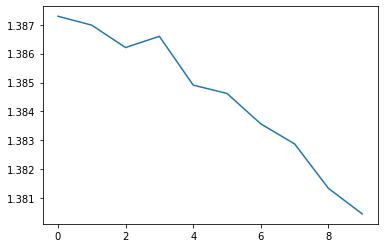

In [724]:
plt.figure()
plt.plot(all_losses_rnn); plt.show()

In [725]:
def evaluate(news_tensor, model):
    model.eval()
    hidden = model.initHidden()
    news_tensor = news_tensor.to(device)

    for i in range(news_tensor.size()[0]):
        hidden = hidden.to(device)
        output, hidden = model(news_tensor[i], hidden)

    return output

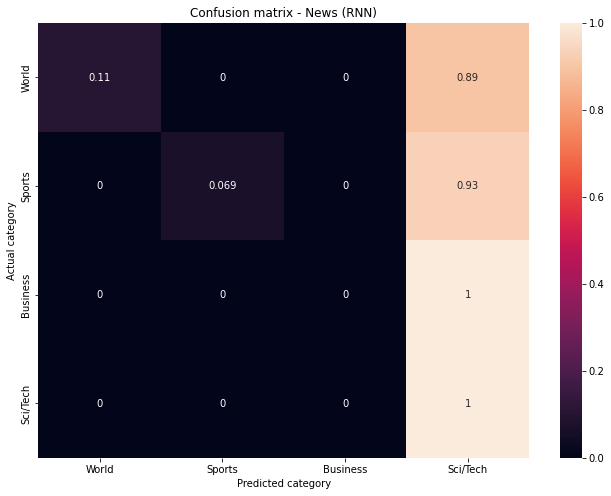

In [726]:
n_confusion = 1000

labels_actual = [None]*n_confusion
labels_pred = [None]*n_confusion


for i in range(n_confusion):
    label_index, news_text, label_tensor, news_tensor = random_news_sample()

    output = evaluate(news_tensor, model_rnn)
    label_index_pred = output_to_label_index(output)

    labels_actual[i] = label_index
    labels_pred[i] = label_index_pred


plt.figure(figsize = (11, 8))

counts = np.array([(np.array(labels_actual) == i).sum() for i in range(n_labels)]).reshape(-1, 1)

cf_matrix = confusion_matrix(labels_actual, labels_pred)
cf_matrix_norm = cf_matrix / counts

df_cm = pd.DataFrame(cf_matrix_norm, index = [index_to_label(i) for i in range(n_labels)], columns = [index_to_label(i) for i in range(n_labels)])
s = sns.heatmap(df_cm, annot=True, cmap=sns.color_palette("rocket", as_cmap=True), vmin=0, vmax=1)
s.set(xlabel='Predicted category', ylabel='Actual category')
plt.title(f'Confusion matrix - News (RNN)')

plt.savefig('news_confusion_matrix_1.png')

In [696]:
def predict(news_text, model, n_predictions=4):
    print('\n> %s' % news_text)
    news_text = str.lower(news_text)
    with torch.no_grad():
        output = evaluate(sentence_to_tensor(news_text), model)

        ratios = F.softmax(output, dim=1)[0]
        topk_vals, topk_inds = ratios.topk(n_predictions)

        # print('\033[4m{: <15} {: >15}\033[0m'.format('rating', 'accuracy'))
        label_pred = index_to_label(topk_inds[0].item())
        print(f'prediction:\t{label_pred}')

        print('accuracies:', end='\t')
        for i in range(n_predictions):
            label_pred = index_to_label(topk_inds[i].item())
            accuracy = topk_vals[i].item()
            print(f'{label_pred} ({accuracy:.3f})', end='    ')
        print('')


predict('Billions of dollars of Chinese money are boosting some European economies - but some of the deals being struck have a catch. Critics say they are "debt traps", where China gets to choose what happens if loans aren\'t repaid.', model_rnn) # Business
predict('Apple to pay $15 to iPhone 4s users for allegedly slowing down the devices', model_rnn) # Sci/Tech
predict('A foreign ministry spokesman on Friday said that Moscow had no intention of deploying tactical nuclear weapons in Ukraine. This comes a day after Russia\'s top diplomat in the US chided Western officials for targeting it with “baseless” accusations.', model_rnn) # World
predict('Madrid Open: Carlos Alcaraz overcame an injury scare on his way to a milestone victory over Rafael Nadal on Friday to set up a blockbuster semi-final against Novak Djokovic in Madrid.', model_rnn) # Sports


> Billions of dollars of Chinese money are boosting some European economies - but some of the deals being struck have a catch. Critics say they are "debt traps", where China gets to choose what happens if loans aren't repaid.
prediction:	World
accuracies:	World (0.265)    Business (0.259)    Sports (0.248)    Sci/Tech (0.227)    

> Apple to pay $15 to iPhone 4s users for allegedly slowing down the devices
prediction:	World
accuracies:	World (0.264)    Business (0.259)    Sports (0.250)    Sci/Tech (0.227)    

> A foreign ministry spokesman on Friday said that Moscow had no intention of deploying tactical nuclear weapons in Ukraine. This comes a day after Russia's top diplomat in the US chided Western officials for targeting it with “baseless” accusations.
prediction:	World
accuracies:	World (0.264)    Business (0.259)    Sports (0.249)    Sci/Tech (0.227)    

> Madrid Open: Carlos Alcaraz overcame an injury scare on his way to a milestone victory over Rafael Nadal on Friday to set 

#### Using the RNN module from pytorch

In [697]:
class RNNPytorch(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(RNNPytorch, self).__init__()

        self.hidden_size = hidden_size
        
        self.rnn = nn.RNN(input_size, hidden_size, num_layers=1, batch_first=True) # 1 is num_layers
        self.fc = nn.Linear(hidden_size, output_size)
        self.lsoftmax = nn.LogSoftmax(dim=1)


    def forward(self, x, hidden):
        x = x.unsqueeze(0)
        hidden, output = self.rnn(x, hidden)

        output = output.contiguous().view(-1, self.hidden_size)
        output = self.fc(output)
        output = self.lsoftmax(output)
        
        return output, hidden


    def initHidden(self):
        return torch.zeros(1, 1, self.hidden_size)

In [708]:
def train(label_tensor, news_tensor, optim, criterion, model):
    label_tensor, news_tensor = label_tensor.to(device), news_tensor.to(device)
    
    model.train()
    hidden = model.initHidden()
    model.zero_grad()

    # Iterate through the whole sentence!
    for i in range(news_tensor.size()[0]):
        hidden = hidden.to(device)
        output, hidden = model(news_tensor[i], hidden)

    label_tensor = label_tensor.unsqueeze(dim=0)
    loss = criterion(output, label_tensor)

    optim.zero_grad()
    loss.backward()
    optim.step()

    return output, loss.item()

In [713]:
criterion = nn.NLLLoss()
learning_rate = 0.005

n_hidden = 128
model_rnnpy = RNNPytorch(n_unique_words, n_hidden, n_labels)
model_rnnpy = model_rnnpy.to(device)

optimizer = optim.SGD(model_rnnpy.parameters(), lr=learning_rate)

n_iters = 100000
print_every = n_iters/1000
plot_every = n_iters/10

total_loss = 0
current_loss = 0
all_losses_rnnpy = []
for iter in range(1, n_iters + 1):
    label_index, news_text, label_tensor, news_tensor = random_news_sample()
    output, loss = train(label_tensor, news_tensor, optimizer, criterion, model_rnnpy)
    total_loss += loss
    current_loss += loss
    
    if iter % print_every == 0:
        label_index_pred = output_to_label_index(output)
        correct = '✔️' if label_index_pred == label_index else '❌'
        avg_loss = total_loss / iter
        print(f'iteration: {iter} ({iter*100/n_iters:.1f}%)  |  loss: {loss:.4f}  |  avg. loss: {avg_loss:.4f}  |  guess: {index_to_label(label_index_pred)}, actual: {index_to_label(label_index)}  {correct}')

    if iter % plot_every == 0:
        all_losses_rnnpy.append(current_loss / plot_every)
        current_loss = 0

iteration: 100 (0.1%)  |  loss: 1.3045  |  avg. loss: 1.3773  |  guess: Business, actual: Sci/Tech  ❌
iteration: 200 (0.2%)  |  loss: 1.1960  |  avg. loss: 1.3812  |  guess: Business, actual: Business  ✔️
iteration: 300 (0.3%)  |  loss: 1.3533  |  avg. loss: 1.3828  |  guess: Business, actual: World  ❌
iteration: 400 (0.4%)  |  loss: 1.4598  |  avg. loss: 1.3871  |  guess: Business, actual: Sci/Tech  ❌
iteration: 500 (0.5%)  |  loss: 1.4412  |  avg. loss: 1.3881  |  guess: World, actual: Sci/Tech  ❌
iteration: 600 (0.6%)  |  loss: 1.2123  |  avg. loss: 1.3855  |  guess: World, actual: World  ✔️
iteration: 700 (0.7%)  |  loss: 1.5028  |  avg. loss: 1.3860  |  guess: World, actual: Business  ❌
iteration: 800 (0.8%)  |  loss: 1.4659  |  avg. loss: 1.3872  |  guess: Sci/Tech, actual: Business  ❌
iteration: 900 (0.9%)  |  loss: 1.3737  |  avg. loss: 1.3870  |  guess: World, actual: Business  ❌
iteration: 1000 (1.0%)  |  loss: 1.3761  |  avg. loss: 1.3874  |  guess: World, actual: Sci/Tech  

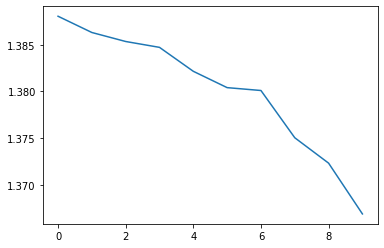

In [714]:
plt.figure()
plt.plot(all_losses_rnnpy); plt.show()

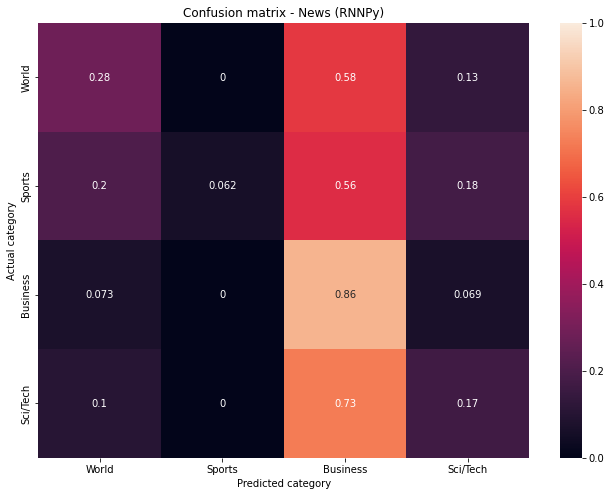

In [715]:
n_confusion = 1000

labels_actual = [None]*n_confusion
labels_pred = [None]*n_confusion


for i in range(n_confusion):
    label_index, news_text, label_tensor, news_tensor = random_news_sample()

    output = evaluate(news_tensor, model_rnnpy)
    label_index_pred = output_to_label_index(output)

    labels_actual[i] = label_index
    labels_pred[i] = label_index_pred


plt.figure(figsize = (11, 8))

counts = np.array([(np.array(labels_actual) == i).sum() for i in range(n_labels)]).reshape(-1, 1)

cf_matrix = confusion_matrix(labels_actual, labels_pred)
cf_matrix_norm = cf_matrix / counts

df_cm = pd.DataFrame(cf_matrix_norm, index = [index_to_label(i) for i in range(n_labels)], columns = [index_to_label(i) for i in range(n_labels)])
s = sns.heatmap(df_cm, annot=True, cmap=sns.color_palette("rocket", as_cmap=True), vmin=0, vmax=1)
s.set(xlabel='Predicted category', ylabel='Actual category')
plt.title(f'Confusion matrix - News (RNNPy)')

plt.savefig('news_confusion_matrix_2.png')

In [716]:
predict('Billions of dollars of Chinese money are boosting some European economies - but some of the deals being struck have a catch. Critics say they are "debt traps", where China gets to choose what happens if loans aren\'t repaid.', model_rnnpy) # Business
predict('Apple to pay $15 to iPhone 4s users for allegedly slowing down the devices', model_rnnpy) # Sci/Tech
predict('A foreign ministry spokesman on Friday said that Moscow had no intention of deploying tactical nuclear weapons in Ukraine. This comes a day after Russia\'s top diplomat in the US chided Western officials for targeting it with “baseless” accusations.', model_rnnpy) # World
predict('Madrid Open: Carlos Alcaraz overcame an injury scare on his way to a milestone victory over Rafael Nadal on Friday to set up a blockbuster semi-final against Novak Djokovic in Madrid.', model_rnnpy) # Sports


> Billions of dollars of Chinese money are boosting some European economies - but some of the deals being struck have a catch. Critics say they are "debt traps", where China gets to choose what happens if loans aren't repaid.
prediction:	World
accuracies:	World (0.287)    Business (0.278)    Sci/Tech (0.243)    Sports (0.192)    

> Apple to pay $15 to iPhone 4s users for allegedly slowing down the devices
prediction:	World
accuracies:	World (0.266)    Business (0.266)    Sci/Tech (0.264)    Sports (0.204)    

> A foreign ministry spokesman on Friday said that Moscow had no intention of deploying tactical nuclear weapons in Ukraine. This comes a day after Russia's top diplomat in the US chided Western officials for targeting it with “baseless” accusations.
prediction:	Business
accuracies:	Business (0.266)    Sci/Tech (0.265)    World (0.265)    Sports (0.205)    

> Madrid Open: Carlos Alcaraz overcame an injury scare on his way to a milestone victory over Rafael Nadal on Friday to s

- - -
## Generative Models

### Interpolate from one latent space to another latent space and visualize the transition using VAE

### Implement and test Conditional VAE (cVAE)

### Test VAE and GAN (or any of their variations) using another task or dataset than FashionMNIST or MNIST, and compare both approaches